In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/Simulation_OpenSYK2/


/content/drive/MyDrive/Simulation_OpenSYK2


In [ ]:
!pip install qutip

     |████████████████████████████████| 14.8 MB 2.6 MB/s 


In [ ]:
#Import libraries 
import qutip as qt
import numpy as np
from numpy import linalg
import scipy as spy
import itertools
import matplotlib.pyplot as plt
from qutip.qip.operations import swap
import pickle
import json 
import os
import cv2 

System Hamiltonian

$H = H_S + H_B + H_{SB}$,

where

\begin{align}
  H_S &= \omega d^{\dagger}d + i \sum_{1\leq a <b}^{2N} K_{ab} \Psi_a \Psi_b\\  &+ \sum_{n=1}^N  \frac{g}{2}\big[ 
    ( \Psi_{2n-1}- i \Psi_{2n}) d + d^{\dagger}( \Psi_{2n-1}+ i \Psi_{2n})   \big],\\
    H_B&= \sum_m \omega_m b_m^{\dagger}b_m.\\
    H_{SB} &= \sum_{n=1}^{N} \sum_m g_m  ( \Psi_{2n-1}- i \Psi_{2n}) b_m +g_m^* b_m^{\dagger}( \Psi_{2n-1}+ i \Psi_{2n})
\end{align}
 $\Psi_a$ are Majorana fermions obeying the algebra
$\{ \Psi_a,\Psi_b\}  = 2\delta_{ab}$. Diagonalizing the skew matrix $K_{ab}$, we obtain
\begin{equation}
     H_S^ \;= \omega d^{\dagger}d +  \sum_{n=1}^{N} \lambda_n \chi_{2n-1} \chi_{2n}   + \frac{g}{2}\big[ 
    ( \chi_{2n-1}-i \chi_{2n}) d + d^{\dagger}( \chi_{2n-1}+i \chi_{2n})   \big].
\end{equation}
Introducing $N$ complex Dirac fermions $c_i (i =1,..,N)$ by 
\begin{eqnarray}
 &\chi_{2j}= \frac{c_j - c_j^{\dagger}}{i}, \\& \chi_{2j-1}=c_j + c_j^{\dagger} \\
     c_j^{\dagger}c_j& = \frac{1}{2} ( 1 +i \chi_{2j-1} \chi_{2j}),
\end{eqnarray}
we obtain 

\begin{equation}
     H_S = \omega d^{\dagger}d +  \sum_{n=1}^{N} \lambda_n (2c_n^{\dagger}c_n -1)   + g( c_n^{\dagger} d + d^{\dagger}c_n ),
\end{equation}

\begin{equation}
    H_{SB} = \sum_{n=1}^{N} \sum_m g_m c_n^{\dagger}b_m 
    + g_m^*b_m^{\dagger}c_n. 
\end{equation}

Rewriting $H_S$ in matrix form we observe that

\begin{equation}
H_s = \begin{pmatrix}
d^{\dagger} \;c^{\dagger}
\end{pmatrix}M
\begin{pmatrix}
d\\
c
\end{pmatrix}
\end{equation}
where $c=\sum_{n=1}^N c_n $ and 
\begin{equation}
    M= \begin{pmatrix}
    w& g & ...&g\\
    g&\lambda_1&\dots &0\\
    \vdots &\vdots &\ddots & \vdots\\
    g& 0 &\dots &\lambda_n
    \end{pmatrix}.
\end{equation}

The eigenvalues of M are given by the zeros of the following characteristic polynomial
\begin{equation}
    (w-\epsilon) \Pi_{n=1}^N (\lambda_n - \epsilon) - g^2 \sum_{P_\alpha}\Pi_{\alpha } (\lambda_\alpha -\epsilon) =0.
\end{equation}
Using these eigenvalues we can rewrite the system Hamiltonian as

$H_S = \sum_i  \epsilon_i \xi_i^\dagger \xi_i$,\begin{eqnarray}
&\xi_n  = \frac{1}{|| \xi_n||} \begin{pmatrix}
    d & c_1 &\dots & c_N
    \end{pmatrix}
    \begin{pmatrix}
    1\\
    \frac{g}{\lambda_1 -\epsilon_n }\\
    \vdots\\
    \frac{g}{\lambda_N -\epsilon_n }  
    \end{pmatrix}\;, n = 0,\dots,N \; ,
\end{eqnarray}

\begin{equation}
    || \xi_n|| = \left( 1 + g^2\sum_i \frac{1}{(\lambda_i-\epsilon_n)^2}\right)^{-1/2},
\end{equation}    
satisfying canonical commutation relations
\begin{eqnarray}
    \{ \xi_i, \xi_j^{\dagger}\} = \delta_{ij} ,\:& \{ \xi_i, \xi_j\} = 0.
\end{eqnarray}


In [ ]:
def anticommutator(a, b):
    return a*b + b*a
#########################################################################################

def fermion_operators(n):
    return [qt.tensor(*[qt.destroy(2) if i == j\
                else (qt.sigmaz() if j < i\
                    else qt.identity(2))\
                        for j in range(n)])\
                            for i in range(n)]

def test_fermion_operators(f):
    for i in range(len(f)):
        for j in range(len(f)):
            d = f[i].shape[0]
            #convert to array .full()
            test1 = anticommutator(f[i], f[j]).full()
            test2 = anticommutator(f[i], f[j].dag()).full()
            if not \
                (np.isclose(test1, np.zeros((d,d))).all()\
                    and \
                ((np.isclose(test2, np.zeros((d,d))).all() and i != j)\
                        or (np.isclose(test2, np.eye(d)).all() and i == j))):
                return False
    return True

#########################################################################################



In [ ]:
# non-diagonalized Hamiltonian

def Hamiltonian(w, g, N, gamma, beta, c_fermi):
  
  n= N//2 # complex fermions number
  wg = np.zeros(n+1)
  wg[0] = w/2 # isolated fermion energy
  wg[1:]= g   # interaction strength

  #random interaction matrix 
  K = np.random.randn(N,N) 
  K = 0.5*(K - K.T)

  # K_ab eigenenergies
  lbd= np.linalg.eigvals(K)
  lbd=[np.imag(lbd)[x] for x in range(0,len(lbd),2)]

  #define M
  M=np.zeros((n+1)**2)
  M= M.reshape(n+1,n+1)
  M[0]= wg
  for x in range(n): 
    M[x+1][x+1] =lbd[x]/2
  M = M + M.T
  epsilon = np.linalg.eigvals(M)

  #coupling constants
  norms= np.sqrt([1+g**2*sum(1/(lbd[i]-epsilon[j])**2 for i in range(len(lbd))) for j in range(len(epsilon))])
  random_c = np.array([1+g*sum(1/(lbd[i]-epsilon[j]) for i in range(len(lbd))) for j in range(len(epsilon))])
  random_c = (random_c/norms)**2
  random_cps = [gamma*(1+np.tanh(0.5*beta*epsilon[i]))*random_c[i] for i in range(len(random_c))]

  # diagonalized Hamiltonian
  H_d = sum([ epsilon[i]*(c_fermi[i].dag()*c_fermi[i]) for i in range(n)]) 
  return H_d, epsilon, lbd, random_cps, norms



In [ ]:

def solve1(times, coupl_c, c_fermi, N, H, norms):

  #jump operators
  J_op = [np.sqrt(coupl_c[i])*c_fermi[i] for i in range(N//2+1)]
  J_opdag=[J_op[j].dag() for j in range(len(J_op))]
  J_ops = J_op.append(J_opdag)
  #central fermion anihilation operator
  d = [c_fermi[i]/norms[i] for i in range(N//2+1)]
  D = sum(d)
  D_op= D.dag()*D
  #collapse operators
  C_op= [J_op[i].dag()*J_op[i] for i in  range(N//2+1)]

  #initial state
  psi_0 =qt.tensor(*[qt.basis(2,1) for j in range(N//2+1)])
  
  #Lindbladian operator
  Lindbladian = qt.liouvillian(H, C_op)
  eps_L =Lindbladian.eigenenergies()

  #evolve and calculate expectation values for each quasi-fermion,d 
  
  out= qt.mesolve(H, psi_0, times, J_op, C_op)
  out_d = qt.mesolve(H, psi_0, times, J_op, D_op)
  rho= qt.mesolve(H, psi_0, times, J_op, [])
  
  return out, out_d, rho, eps_L


In [ ]:
# Exponential series solution 
def solve2(H,c_fermi,coupl_c,N):
  
  # jump operators
  J_op = [np.sqrt(coupl_c[i])*c_fermi[i] for i in range(N//2+1)]
  J_opdag=[J_op[j].dag() for j in range(len(J_op))]

  # Liouvillian
  L = qt.liouvillian(H,J_op) 

  #initial state
  rho0= qt.tensor(*[qt.basis(2,1) for j in range(N//2+1)])
  rho0= qt.ket2dm(rho0)

  #solution as an exponential series
  rhoES = qt.ode2es(L,rho0)

  # calculate expectation values 
  counts = [qt.esval(qt.expect(J.dag()*J ,rhoES),times)for J in J_op]

  return counts 


In [ ]:
#System variables



class OpenSYK():
  def __init__(self, w, gamma_w, w_g, N, gamma_beta, model):
    # Model
    self.Model= model
   
    # Central fermion strength 
    self.w= w
    self.w_g= w_g

    # Interaction strength
    self.g = (1/self.w_g)* self.w

    # Majorana fermions number
    self.N= N

    # Coupling function strength 
    self.gamma_w= gamma_w
    self.gamma= self.w*self.gamma_w
    self.gamma_beta = gamma_beta
    # Bath temperature
    self.beta = self.gamma*(1/self.gamma_beta)

    #number of fermions = [complex fermions + central fermion(model 1), complex fermions(model 2)]
    self.n1 = N//2+1
    self.n2 = N//2

    #model
   # self.model= model
  
  #Define fermion operators using the Jordan-Wigner transform (n or N//2)
  @property
  def fermion_operators(self):
    if self.Model==1:
      return [qt.tensor(*[qt.destroy(2) if i == j\
                  else (qt.sigmaz() if j < i\
                      else qt.identity(2))\
                          for j in range(self.n1)])\
                              for i in range(self.n1)]
    if self.Model==2:
      return [qt.tensor(*[qt.destroy(2) if i == j\
                  else (qt.sigmaz() if j < i\
                      else qt.identity(2))\
                          for j in range(self.n2)])\
                              for i in range(self.n2)]

  
  #Hamiltonian of the system SYK+central fermion
  @property
  def Hamiltonian1(self):
    N = self.N
    c_fermi = self.fermion_operators
    wg = np.zeros(self.n1)
    wg[0] = self.w/2 # isolated fermion energy
    wg[1:]= self.g   # interaction strength

    #random interaction matrix 
    K = np.random.randn(self.N,self.N) 
    K = 0.5*(K - K.T)

    # K_ab eigenenergies
    lbd= np.linalg.eigvals(K)
    lbd=[np.imag(lbd)[x] for x in range(0,len(lbd),2)]

    #define M
    M=np.zeros((self.n1)**2)
    M= M.reshape(self.n1,self.n1)
    M[0]= wg
    for x in range(self.n2): 
      M[x+1][x+1] =lbd[x]/2
    M = M + M.T
    epsilon = np.linalg.eigvals(M)

    #coupling constants and quasifermions normalizations constants
    norms= np.sqrt([1+self.g**2*sum(1/(lbd[i]-epsilon[j])**2 for i in range(len(lbd))) for j in range(len(epsilon))])
    random_c = np.array([1+self.g*sum(1/(lbd[i]-epsilon[j]) for i in range(len(lbd))) for j in range(len(epsilon))])
    random_c = (random_c/norms)**2
    random_cps = [N*self.gamma*(1+np.tanh(0.5*self.beta*epsilon[i]))*random_c[i] for i in range(len(random_c))]

    # diagonalized Hamiltonian
    H_d = sum([ epsilon[i]*(c_fermi[i].dag()*c_fermi[i]) for i in range(self.n2)]) 
    return  H_d, epsilon, lbd, random_cps, norms




In [ ]:
# Parameters 

P = {"w": [1e-1,1,1e1],"gamma/w":[1,1e1,1e2], "w/g": np.array([5e-2, 1e-1, 5e-1, 1, 5, 1e1, 5e1, 1e2, 5e2]),\
     "N":10, "gamma/beta" : np.array([1e-6, 1e-4, 1e-3,1e-2,1e-1, 1, 1e1,1e2,1e3]), "AverageNumber":50}

len_i= len(P["w"])
len_j= len(P["gamma/w"])
len_k= len(P["w/g"])
len_l= len(P["gamma/beta"])
times = np.arange(0,8,1e-2)

# Generate an especific model
def create_Model(i,j,k,l):
  return OpenSYK(P["w"][i], P["gamma/w"][j], P["w/g"][k], P["N"], P["gamma/beta"][l], 1 )


K = np.arange(4,6)
K

array([4, 5])

In [ ]:
# sampling 
i,j= 1,1



for k in K:
  for l in range(len_l):
    Model = create_Model(i,j,k,l)
    data= { "counts_d":[], "purity":[], "entropy":[], "eigenvalues":[], "eigenvalues_L":[]}
    f = Model.fermion_operators
    N = P["N"]
    for m in range (P["AverageNumber"]):
      if not(m%10):
          print(l,m)
      purity=[]
      entropy=[]
      H, eig, lamb, coupl_c,  quasi_norms =  Model.Hamiltonian1
      eig = np.sort(eig)
      result_q, result_d, rho,  eig_L = solve1(times, coupl_c, f, N, H, quasi_norms)
      counts_q= result_q.expect
      counts_d= result_d.expect
      rhot = rho.states
      # purity_min = [1/2**(N//2+1)]*len(rhot)
      # entropy_max= [np.log(2**(N//2+1))]*len(rhot)
      # d_min = [min(counts_d[0])]*len(rhot)

      for m in range(len(rhot)):
          # purity
          purity.append((rhot[m]**2).tr())
          #entropy
          entropy.append(qt.entropy_vn(rhot[m]))
      #save data
      data["counts_d"].append(counts_d)
      data["eigenvalues"].append(eig)
      data["eigenvalues_L"].append(eig_L)
      data["purity"].append(purity)
      data["entropy"].append(entropy) 
    
    print(i,j,k,l," process saved")
    with open('DataBatch/w%.3f_w_g%.3f_'%(Model.w, Model.w_g)+'N%.1f_'%(N)\
              +'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta)+'.pickle','wb') as handle:
              pickle.dump(data, handle, protocol=pickle.HIGHEST_PROTOCOL) 






NameError: ignored

In [ ]:
DATA=[]
i,j= 0,0

for k in range(len_k):
  for l in range(len_l):
    Model = create_Model(i,j,k,l)
    with open('DataBatch/w%.3f_w_g%.3f_'%(Model.w, Model.w_g)+'N%.1f_'%(P["N"])\
              +'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta)+'.pickle','rb') as handle:
      DATA.append(pickle.load( handle))

DATA = np.array(DATA)



In [ ]:

DATA = DATA.reshape(len_k,len_l)
DATA.shape


(9, 9)

In [ ]:
#Purity sampling 
i,j= 0,0
N = P["N"]
for k in range(len_k):
  for l in range(len_l):
    fig = plt.figure(figsize=(10,10))
    Model = create_Model(i,j,k,l)
    av_purity=  (np.array(DATA[k][l]["purity"]).sum(axis=0))/50 

    purity_min = [1/2**(P["N"]//2+1)]*len(times)
    for m in range(P["AverageNumber"]):
      plt.plot(times,DATA[k][l]["purity"][m],linewidth=0.2)
    plt.plot(times, av_purity,label="average purity")
    plt.plot(times,purity_min, label="min. purity")

    plt.ylabel("Purity of $\\rho(t)$",fontsize=14)
    plt.xlabel("time", fontsize=14)
    plt.title("Purity "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)+'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta))
    plt.legend()
    plt.savefig("ImagesBatch/Purity/Purity "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)+'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta))
    plt.close(fig)

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


In [ ]:
#Entropy sampling 
i,j= 0,0
N = P["N"]
for k in range(len_k):
  for l in range(len_l):
    fig = plt.figure(figsize=(10,10))
    Model = create_Model(i,j,k,l)
    av_entropy=  (np.array(DATA[k][l]["entropy"]).sum(axis=0))/50 
    entropy_max= [np.log(2**(N//2+1))]*len(times)

    
    for m in range(P["AverageNumber"]):
      plt.plot(times,DATA[k][l]["entropy"][m],linewidth=0.2)
    plt.plot(times, av_entropy,label="average entropy")
    plt.plot(times, entropy_max, label="max. entropy")

    plt.ylabel("Entropy of $\\rho(t)$",fontsize=18)
    plt.xlabel("time", fontsize=18)
    plt.title("Entropy "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)+'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta))
    plt.legend()
    plt.savefig("ImagesBatch/Entropy/Entropy "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)+'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta))
    plt.close(fig)

In [ ]:
#Occupation number sampling 
i,j= 0,0
N = P["N"]
for k in range(len_k):
  for l in range(len_l):
    fig = plt.figure(figsize=(10,10))
    Model = create_Model(i,j,k,l)
    av_occ=  (np.array(DATA[k][l]["counts_d"]).sum(axis=0))/50 
    d_min = [min(av_occ[0])]*len(times)
    
    for m in range(P["AverageNumber"]):
      plt.plot(times,DATA[k][l]["counts_d"][m][0],linewidth=0.2)
    plt.plot(times, av_occ[0],label="average occupation number prob.")
    plt.plot(times, d_min, label="min. occupation prob. %.2f"%(d_min[0]))

    plt.ylabel("  $dd^\dagger$",fontsize=18)
    plt.xlabel("time", fontsize=18)
    plt.title("Occupation number prob."+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
              +'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta))
    plt.legend()
    plt.savefig("ImagesBatch/OccupationNumber/OccupationN "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
                +'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta))
    plt.close(fig)



In [ ]:
#H eigenvalues

i,j= 0,0
N = P["N"]
for k in range(len_k):
  for l in range(len_l):
    fig = plt.figure(figsize=(10,10))
    Model = create_Model(i,j,k,l)
    w = Model.w
    eig =np.array(DATA[k][l]["eigenvalues"])
    eig = np.sort(eig)/w
    av_eig=  (eig.sum(axis=0))/(50) 
    x= np.arange(1,len(av_eig)+1)
    
    for m in range(P["AverageNumber"]):
      plt.scatter(x,eig[m], c ="b",s=17)
    plt.scatter(x, av_eig,label="average eigenvalue ", c="r", s= 27 )
    

    plt.ylabel("  $\epsilon_i/\omega$",fontsize=18)
    plt.xlabel("i", fontsize=18)
    plt.title("Eigenvalue distribution of H "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
              +'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta))
    plt.legend()
    plt.savefig("ImagesBatch/Eigenvalues_H/Eigenvalues_H "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
                +'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta))
    plt.close(fig)




In [ ]:
#L eigenvalues

i,j= 0,0

N = P["N"]
for k in range(len_k):
  for l in range(len_l):
    fig = plt.figure(figsize=(10,10))
    Model = create_Model(i,j,k,l)
    w = Model.w
    eig =np.array(DATA[k][l]["eigenvalues_L"])/w
    Re_eig= np.real(eig)
    Im_eig= np.imag(eig)
    
    
    for m in range(P["AverageNumber"]):
      plt.scatter(Re_eig, Im_eig, c ="b",s=10)
    
    

    plt.ylabel("Im"+"$L$",fontsize=18)
    plt.xlabel("Re"+"$L$", fontsize=18)
    plt.title("Eigenvalue distribution of L "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
              +'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f'%(Model.gamma_w, Model.gamma_beta))
    #plt.legend()
    plt.savefig("ImagesBatch/Eigenvalues_L/Eigenvalues_L "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
                +'N%.1f_'%(N)+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta))
    plt.close(fig)




In [ ]:
from numpy.lib.function_base import kaiser
from PIL import Image

In [ ]:
i,j =0,0

Images= []
for k in range(len_k):
  for l in range(len_l):
    Model = create_Model(i,j,k,l)
    name= "ImagesBatch/Purity/Purity "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta)
    Images.append(Image.open(name))


Images = np.array(Images)
Images = Images.reshape(len_k, len_l)

#Purity

for k in range(len_k):
    Model = create_Model(i,j,k,0)
    Images[k][0].save('AnimationsOPENSYK2/Ani_Purity/AniPurity '+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f.gif'%(Model.gamma_w),\
                      save_all=True, append_images= Images[k][1:],  optimize=False, duration= 1090, loop=0)
  
 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  # This is added back by InteractiveShellApp.init_path()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # This is added back by InteractiveShellApp.init_path()


In [ ]:
Images= []
for k in range(len_k):
  for l in range(len_l):
    Model = create_Model(i,j,k,l)
    name= "ImagesBatch/Entropy/Entropy "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta)
    Images.append(Image.open(name))


Images = np.array(Images)
Images = Images.reshape(len_k, len_l)

#Entropy


for k in range(len_k):
    Model = create_Model(i,j,k,0)
    Images[k][0].save('AnimationsOPENSYK2/Ani_Entropy/AniEntropy '+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f.gif'%(Model.gamma_w),\
                      save_all=True, append_images= Images[k][1:],  optimize=False, duration= 1090, loop=0)
  
 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if __name__ == '__main__':


In [ ]:
Images= []
for k in range(len_k):
  for l in range(len_l):
    Model = create_Model(i,j,k,l)
    name= "ImagesBatch/OccupationNumber/OccupationN "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta)
    Images.append(Image.open(name))


Images = np.array(Images)
Images = Images.reshape(len_k, len_l)

#Occupation Number


for k in range(len_k):
    Model = create_Model(i,j,k,0)
    Images[k][0].save('AnimationsOPENSYK2/Ani_OccupationNumber/AniOccupationN '+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f.gif'%(Model.gamma_w),\
                      save_all=True, append_images= Images[k][1:],  optimize=False, duration= 1090, loop=0)
  
 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  if __name__ == '__main__':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if __name__ == '__main__':


In [ ]:
Images= []
for k in range(len_k):

  for l in range(len_l):
    Model = create_Model(i,j,k,l)
    name= "ImagesBatch/Eigenvalues_L/Eigenvalues_L "+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f_gamma_beta%.6f.jpg'%(Model.gamma_w, Model.gamma_beta)
    Images.append(Image.open(name))


Images = np.array(Images)
Images = Images.reshape(len_k, len_l)

#Occupation Number


for k in range(len_k):
    Model = create_Model(i,j,k,0)
    Images[k][0].save('AnimationsOPENSYK2/Ani_Eigenvalues_L/AniEigenvalues_L '+'w%.3f_w_g%.3f_'%(Model.w, Model.w_g)\
    +'N%.1f_'%(P["N"])+'gamma_w%.3f.gif'%(Model.gamma_w),\
                      save_all=True, append_images= Images[k][1:],  optimize=False, duration= 1090, loop=0)
  
 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  # Remove the CWD from sys.path while we load stuff.


0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

4


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

8


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

12


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

16


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`)

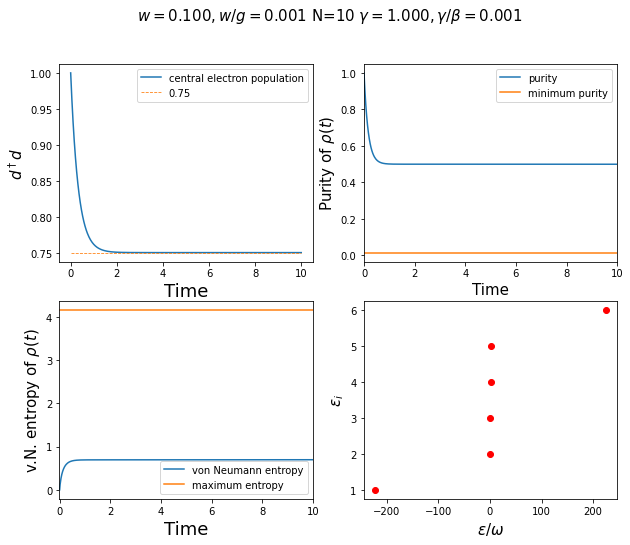

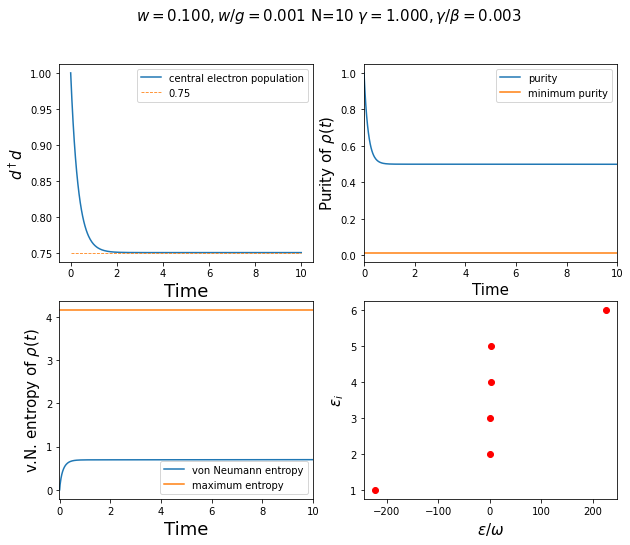

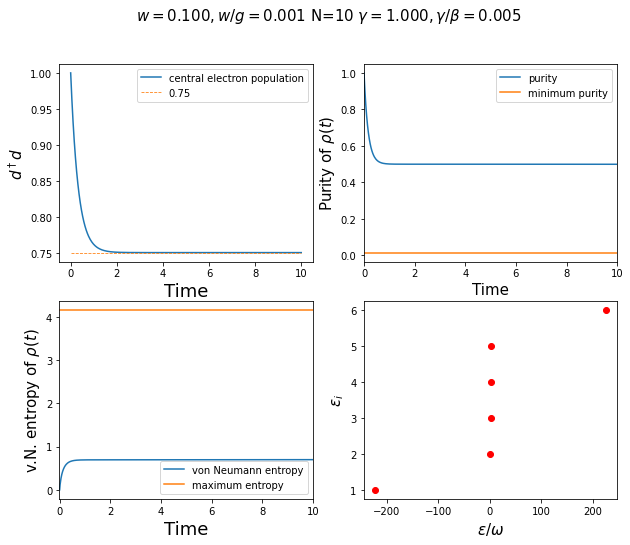

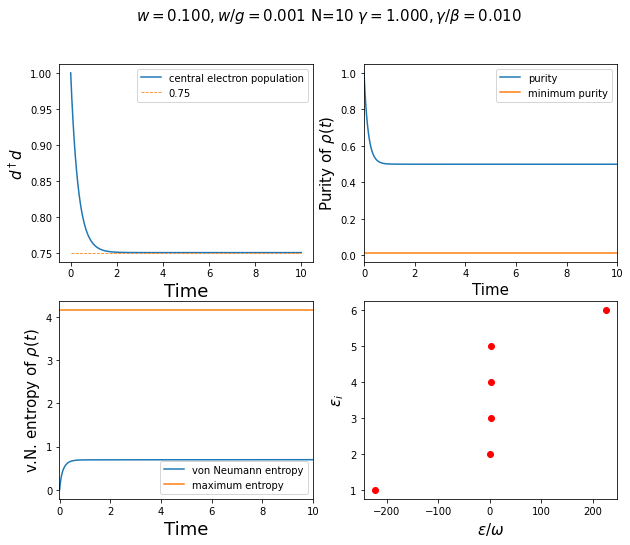

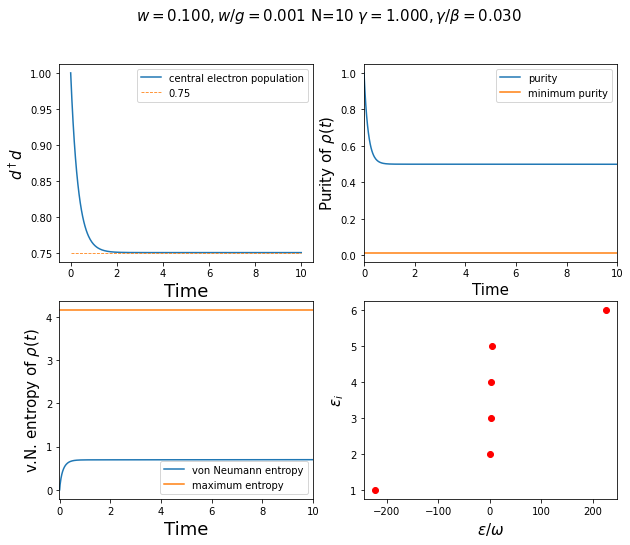

...

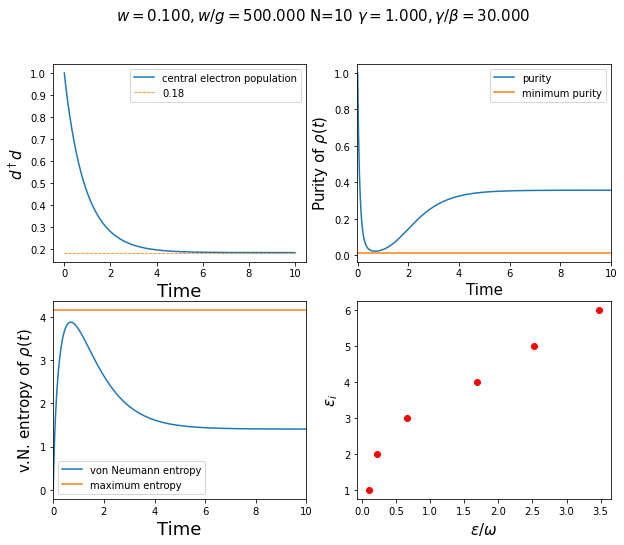

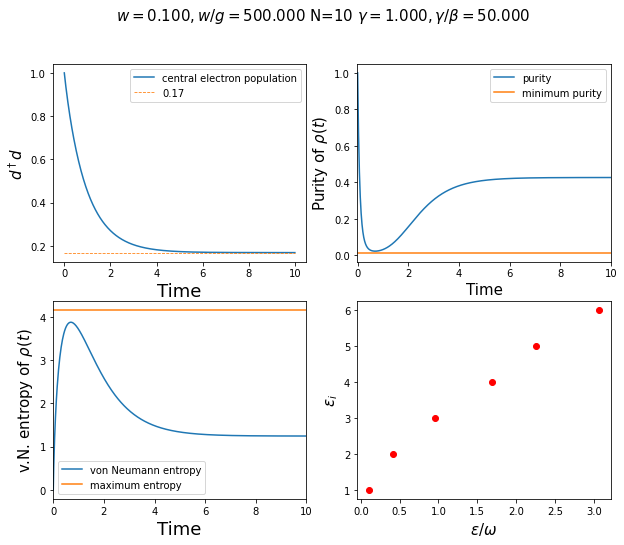

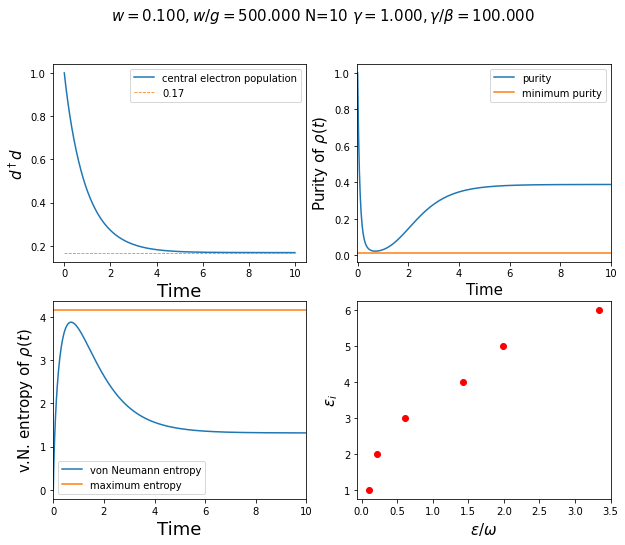

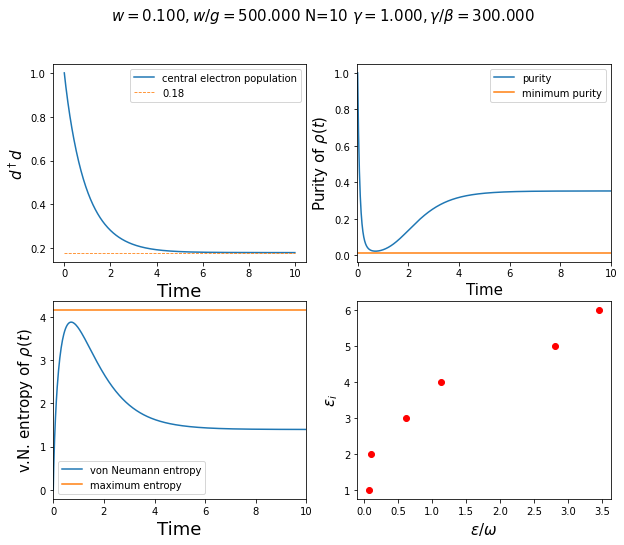

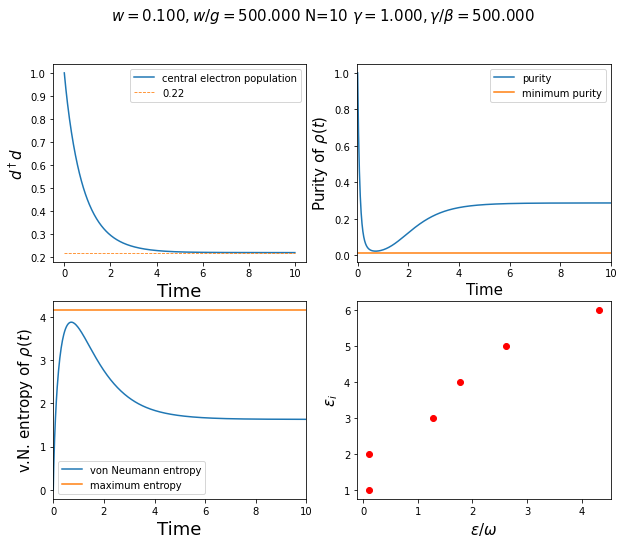

In [ ]:


##################################################

#Calculate the time evolution of the system
for i in range (cases):
  if not(i%4):
    print(i)
  for j in range(cases):
    data= { "counts_d":[], "purity":[], "entropy":[], "eigenvalues":[]}
    purity=[]
    entropy=[]
    H, eps, lamb, coupl_c,  quasi_norms = Hamiltonian(w, g[i], N, gamma, beta[j], f)
    eps = np.sort(eps)
    x = np.arange(1,len(eps)+1)
    result_q, result_d, rho = solve1(coupl_c, times, f, N, H, quasi_norms )
    counts_q= result_q.expect
    counts_d= result_d.expect
    rhot = rho.states
    purity_min = [1/2**(N//2+1)]*len(rhot)
    entropy_max= [np.log(2**(N//2+1))]*len(rhot)
    d_min = [min(counts_d[0])]*len(rhot)

    for k in range(len(rhot)):
        # purity
        purity.append((rhot[k]**2).tr())
        #entropy
        entropy.append(qt.entropy_vn(rhot[k]))
    #save data
    data["counts_d"].append(counts_d)
    data["eigenvalues"].append(eps)
    data["purity"].append(purity)
    data["entropy"].append(entropy) 
    with open('w_g'+'%.3f_'%(w/g[i])+'N%.f_'%(N)+'gamma_beta%.3f.pickle'%(gamma/beta[j]),'wb') as handle:
            pickle.dump(data, handle, protocol=pickle.HIGHEST_PROTOCOL) 
    ##################################################
    fig, ((ax1,ax2),(ax3,ax4)) = plt.subplots(2,2, figsize=(10,8))


    # for count in counts_q:
    #   ax1.plot(times, np.real(count), '-')
    # ax1.set_xlabel('Time', fontsize=18)
    # ax1.set_ylabel(r'$\xi_i^\dagger\xi_i$', fontsize=15)
    # #ax1.set_ylim(-0.01,1)
    # ax1.set_xlim(0.07,max(times))

    # Central electron population
    ax1.plot(times,np.real(counts_d[0]), '-', label= "central electron population")
    ax1.plot(times,np.real(d_min), '--', label="%.2f"%(d_min[0]),linewidth=0.8)
    ax1.set_xlabel('Time', fontsize=18)
    ax1.set_ylabel(r'$d^\dagger d$', fontsize=15)
    #ax2.set_xlim(0,10)
    ax1.legend()

    #Purity of the system
    ax2.plot(times,purity,label="purity")
    ax2.plot(times,purity_min,label="minimum purity")
    ax2.set_xlim(-0.02,max(times))
    ax2.set_xlabel('Time', fontsize=15)
    ax2.set_ylabel("Purity of $\\rho(t)$", fontsize=15)
    ax2.legend()

    #Entropy of the system
    ax3.plot(times,entropy,label="von Neumann entropy")
    ax3.set_xlim(-0.02,max(times))
    ax3.plot(times,entropy_max,label="maximum entropy")
    ax3.set_xlabel('Time', fontsize=18)
    ax3.set_ylabel("v.N. entropy of $\\rho(t)$", fontsize=15)
    ax3.legend()

    #Eigen energies of the system
    ax4.scatter(eps, x, label="eigen energies", c='r')
    ax4.set_ylabel(r"$\epsilon_i$",fontsize=15)
    ax4.set_xlabel(r"$\epsilon/\omega$",fontsize=15)

    fig.suptitle(r'$w=%.3f, w/g=%.3f$'%(w,w/g[i])+' N=%.f '%(N)+r'$\gamma= %.3f, \gamma/\beta=%.3f $'%(gamma,gamma/beta[j]),fontsize=15)
    plt.savefig('Images/w_g'+'%.3f_'%(w/g[i])+'N%.f_'%(N)+'gamma_beta%.3f.jpg'%(gamma/beta[j]) )

In [ ]:
#Fixed g
images = np.array(images)
for j in range(cases):
  images.T[j][0].save('AnimationsOPENSYK2/Fixed_g/w%.3f_w_g%.3f_'%(w,w/g[j])+'N%.f_'%(N)+'gamma%.3f.gif'%(gamma),\
                      save_all=True, append_images= images.T[j][1:],  optimize=False, duration=990, loop=0)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  


In [ ]:
#MWabala mesoscopic system 
#system variables
#################################################

w=3
N=500
e= 1
g= 1
theta= 0.5*np.arctan((2*g*np.sqrt(N))/(w-e))
Omega_N= np.sqrt(4*N*g**2+ (w-e)**2)
gamma= 1
beta= 1
c_fermions = fermion_operators(2)
times = np.linspace(0.0, 1e-2, 100)
c0= c_fermions[0]
c1= c_fermions[1]

#eigen energies

ld0= 0.5*(w+e) + 0.5*Omega_N
ld1= 0.5*(w+e) - 0.5*Omega_N

# Colapse operators

e0 =np.sqrt(N*gamma*(1+np.tanh(0.5*beta*ld0))*(np.sin(theta))**2)*c0
e1 =np.sqrt(N*gamma*(1+np.tanh(0.5*beta*ld1))*(np.cos(theta))**2)*c1
e0_s= np.sqrt(N*gamma*(1-np.tanh(0.5*beta*ld0))*(np.sin(theta))**2)*c0
e1_s= np.sqrt(N*gamma*(1-np.tanh(0.5*beta*ld1))*(np.cos(theta))**2)*c1
E0=e0.dag()*e0
E1=e1.dag()*e1
H= c0.dag()*c0*ld0+ c1.dag()*c1*ld1

#################################################
id=qt.tensor(qt.basis(2,0),qt.basis(2,0))
id1= qt.fock(4,1)
psi_0= np.cos(theta)*c0*id -np.sin(theta)*c1*id

#qt.tensor(qt.basis(2,0),qt.basis(2,0)).full

In [ ]:
def solveMwala(times, c_fermions, theta, gamma, beta, Omega_N, N):
  
  id= qt.tensor(qt.basis(2,1),qt.basis(2,1))
  # quasifermionic operators

  c0= c_fermions[0]
  c1= c_fermions[1]
  #eigen energies

  ld0= 0.5*(w+e) + 0.5*Omega_N
  ld1= 0.5*(w+e) - 0.5*Omega_N
  # Colapse operators

  e0 =np.sqrt(N*gamma*(1+np.tanh(0.5*beta*ld0))*(np.sin(theta))**2)*c0
  e1 =np.sqrt(N*gamma*(1+np.tanh(0.5*beta*ld1))*(np.cos(theta))**2)*c1
  e0_s= np.sqrt(N*gamma*(1-np.tanh(0.5*beta*ld0))*(np.sin(theta))**2)*c0
  e1_s= np.sqrt(N*gamma*(1-np.tanh(0.5*beta*ld1))*(np.cos(theta))**2)*c1
  E0=e0.dag()*e0
  E1=e1.dag()*e1
  E0_s=e0_s.dag()*e0_s
  E1_s=e1_s.dag()*e1_s
  #Hamiltonian

  H= c0.dag()*c0*ld0+ c1.dag()*c1*ld1

  #initial state

  psi_0= np.cos(theta)*c0*id -np.sin(theta)*c1*id
  d= np.cos(theta)*c0 -np.sin(theta)*c1
  #evolve and calculate expectation values for each quasi-fermion
  out= qt.mesolve(H, id, times, [e0, e0.dag(), e1, e1.dag(), e0_s, e0_s.dag(), e1_s, e1_s.dag()], [d.dag()*d])
  out1 = qt.mesolve(H, id, times, [e0,e0.dag(), e1, e1.dag(), e0_s, e0_s.dag(), e1_s, e1_s.dag()], [])
  return out.expect, out1


In [ ]:
count_mwalaba, result= solveMwala(times, c_fermions, theta, gamma, beta, Omega_N, N)
count_mwalaba
rhot =result.states
purity=[]
for i in range(len(rhot)):
    # inefficient method
    purity.append((rhot[i]**2).tr())



(0.0, 0.01)

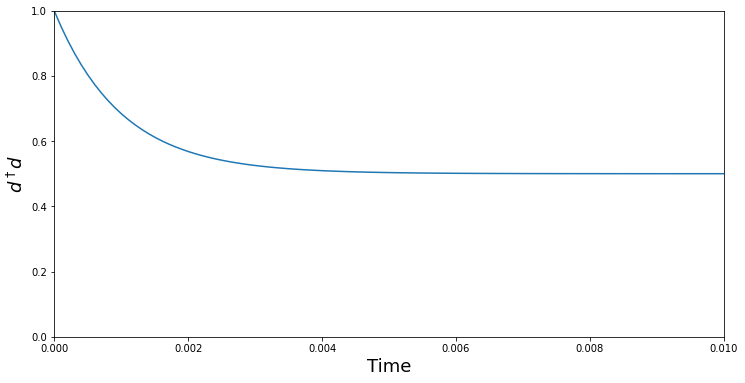

In [ ]:
fig, ax = plt.subplots(figsize=(12,6))
for count in count_mwalaba:
  ax.plot(times, np.real(count), '-')
ax.set_xlabel('Time', fontsize=18)
ax.set_ylabel(r'$d^\dagger d$', fontsize=18)
ax.set_ylim(0,1)
ax.set_xlim(0,max(times))